In [1]:
from keras.models import load_model
import pandas as pd
import numpy as np
import os
import random
import cv2
import matplotlib.pyplot as plt

In [2]:
def plt_figure(images: list, titles: list, rows=1, columns=1, w=5, h=5):
    fig = plt.figure(figsize=(w, h))
    count = 1
    for image, title in zip(images, titles):
        fig.add_subplot(rows, columns, count)
        count += 1
        plt.imshow(image)
        plt.axis('off')
        plt.title(title)

In [3]:
model = load_model('./model/efficientnetb3-Plant Village Disease-99.65.h5', )
model.load_weights('./model/efficientnetb3-Plant Village Disease-weights.h5')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional)  (None, 1536)             10783535  
                                                                 
 batch_normalization (BatchN  (None, 1536)             6144      
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 256)               393472    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 38)                9766      
                                                                 
Total params: 11,192,917
Trainable params: 11,102,542
Non-trainable params: 90,375
_______________________________________

In [4]:
images = []

for cat in os.listdir('./plantvillage-dataset/color'):
    cat_files = []
    for file in os.listdir('./plantvillage-dataset/color/'+cat):
        if file.endswith('JPG'):
            cat_files.append('./plantvillage-dataset/color/'+cat+'/'+file)
    cat_files = random.sample(cat_files, 3)
    images.append(cat_files)
images = np.reshape(images,-1)
images = np.array([cv2.resize(cv2.imread(file),(224,224)) for file in images])

In [5]:
pred = model.predict(images)

4/4 [==============================] - 8s 559ms/step


In [6]:
class_data = pd.read_csv('./class_dict.csv')
class_data.head()

,class_index,class,height,width
0,0,Apple___Apple_scab,224,224
1,1,Apple___Black_rot,224,224
2,2,Apple___Cedar_apple_rust,224,224
3,3,Apple___healthy,224,224
4,4,Blueberry___healthy,224,224


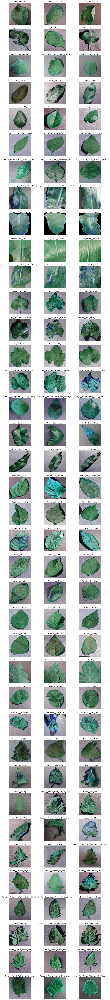

In [7]:
plt_figure(images, class_data['class'][np.argmax(pred,axis=1)], columns=3, rows=38, w=15,h=150)